In [19]:
import sys
import os

# Ajouter le chemin du projet au PATH
sys.path.append(os.path.abspath(".."))

from modules.data_import import loadAndMergeData, exportDataCSV

# Charger les données
merge2 = loadAndMergeData()
merge2.info()
exportDataCSV(merge2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   Attrition                4410 non-null   object 
 2   BusinessTravel           4410 non-null   object 
 3   Department               4410 non-null   object 
 4   DistanceFromHome         4410 non-null   int64  
 5   Education                4410 non-null   int64  
 6   EducationField           4410 non-null   object 
 7   EmployeeCount            4410 non-null   int64  
 8   EmployeeID               4410 non-null   int64  
 9   Gender                   4410 non-null   object 
 10  JobLevel                 4410 non-null   int64  
 11  JobRole                  4410 non-null   object 
 12  MaritalStatus            4410 non-null   object 
 13  MonthlyIncome            4410 non-null   int64  
 14  NumCompaniesWorked      

In [16]:
merge2.describe()

,Age,DistanceFromHome,Education,EmployeeCount,EmployeeID,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StandardHours,...,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
count,4410.000000,4410.000000,4410.000000,4410.0,4410.000000,4410.000000,4410.000000,4391.000000,4410.000000,4410.0,...,4401.000000,4410.000000,4410.000000,4410.000000,4410.000000,4385.000000,4390.000000,4372.000000,4410.000000,4410.000000
mean,36.923810,9.192517,2.912925,1.0,2205.500000,2.063946,65029.312925,2.694830,15.209524,8.0,...,11.279936,2.799320,7.008163,2.187755,4.123129,2.723603,2.728246,2.761436,2.729932,3.153741
std,9.133301,8.105026,1.023933,0.0,1273.201673,1.106689,47068.888559,2.498887,3.659108,0.0,...,7.782222,1.288978,6.125135,3.221699,3.567327,1.092756,1.101253,0.706245,0.711400,0.360742
min,18.000000,1.000000,1.000000,1.0,1.000000,1.000000,10090.000000,0.000000,11.000000,8.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,30.000000,2.000000,2.000000,1.0,1103.250000,1.000000,29110.000000,1.000000,12.000000,8.0,...,6.000000,2.000000,3.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000
50%,36.000000,7.000000,3.000000,1.0,2205.500000,2.000000,49190.000000,2.000000,14.000000,8.0,...,10.000000,3.000000,5.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,43.000000,14.000000,4.000000,1.0,3307.750000,3.000000,83800.000000,4.000000,18.000000,8.0,...,15.000000,3.000000,9.000000,3.000000,7.000000,4.000000,4.000000,3.000000,3.000000,3.000000
max,60.000000,29.000000,5.000000,1.0,4410.000000,5.000000,199990.000000,9.000000,25.000000,8.0,...,40.000000,6.000000,40.000000,15.000000,17.000000,4.000000,4.000000,4.000000,4.000000,4.000000


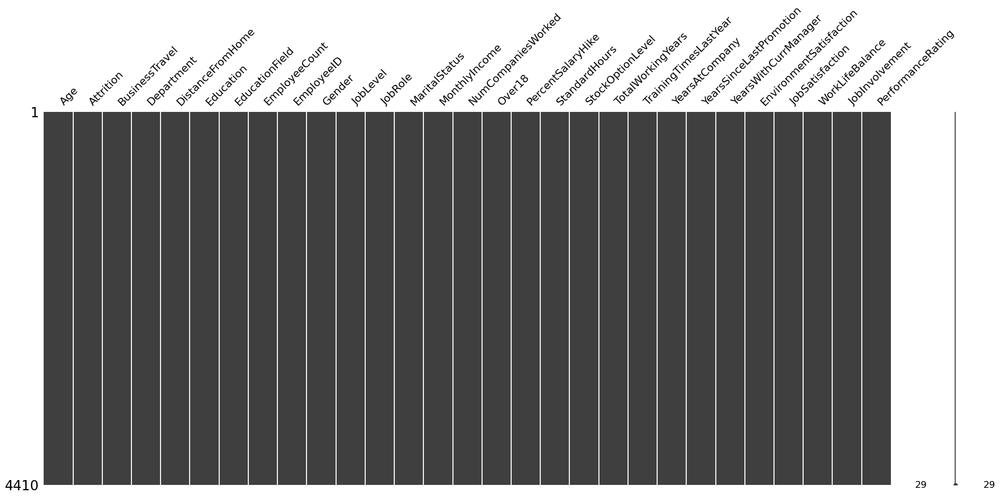

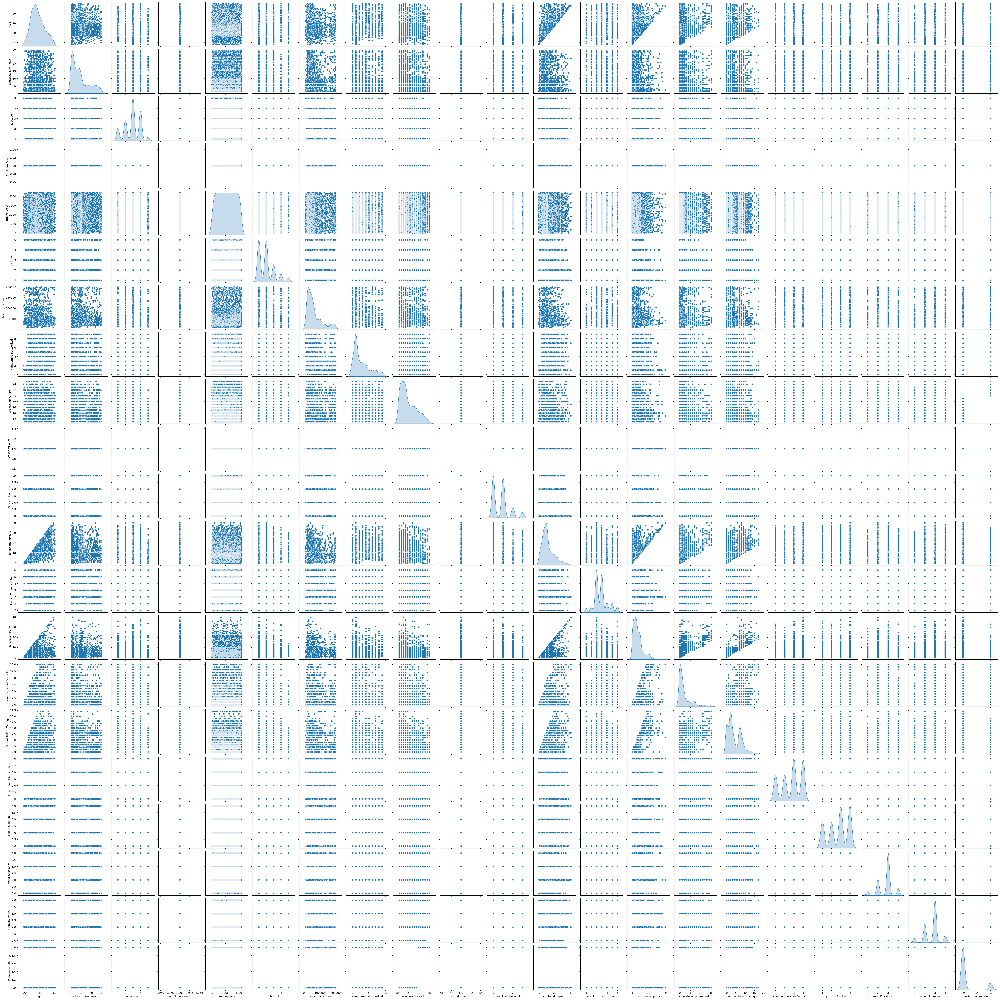

In [18]:
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize missing data
msno.matrix(merge2)
plt.show()

# Impute missing values
# For numerical columns, use median imputation
numerical_columns = merge2.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_columns:
    if col == "TotalWorkingYears":
        # Remplacer les NA dans 'TotalWorkingYears' par la valeur de 'YearsAtCompany'
        merge2[col] = merge2[col].fillna(merge2["YearsAtCompany"])
    else:
        # Remplacer les NA pour les autres colonnes numériques par leur médiane
        merge2[col] = merge2[col].fillna(merge2[col].median())

# For categorical columns, use mode imputation
categorical_columns = merge2.select_dtypes(include=['object']).columns
merge2[categorical_columns] = merge2[categorical_columns].fillna(merge2[categorical_columns].mode().iloc[0])

# Verify that there are no more missing values
merge2.isnull().sum()

sns.pairplot(merge2[numerical_columns], diag_kind='kde')
plt.show()

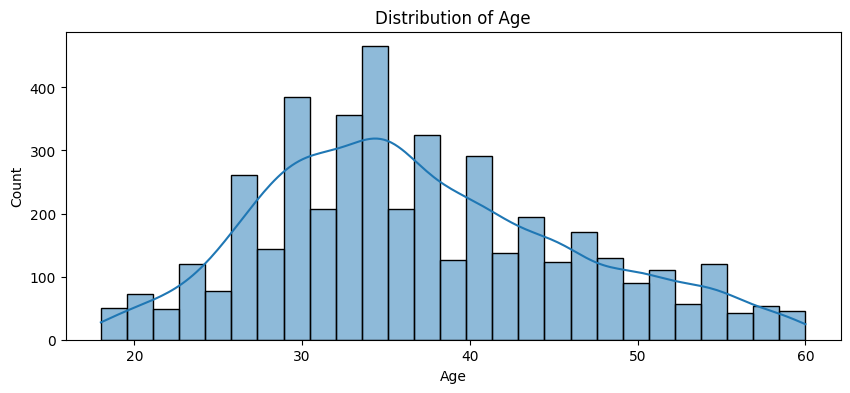

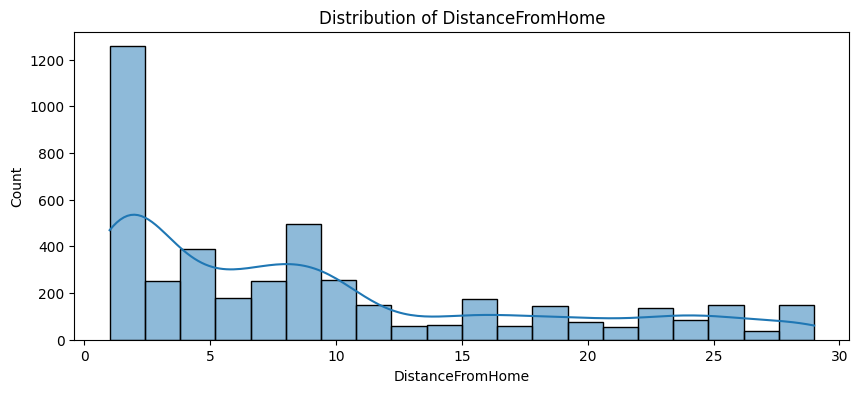

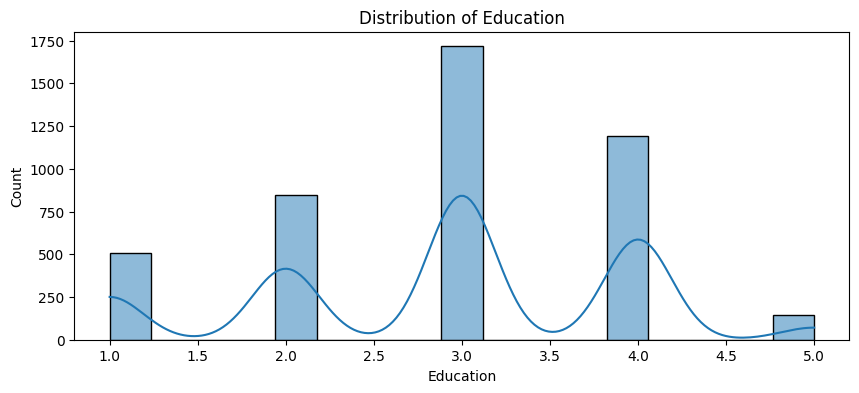

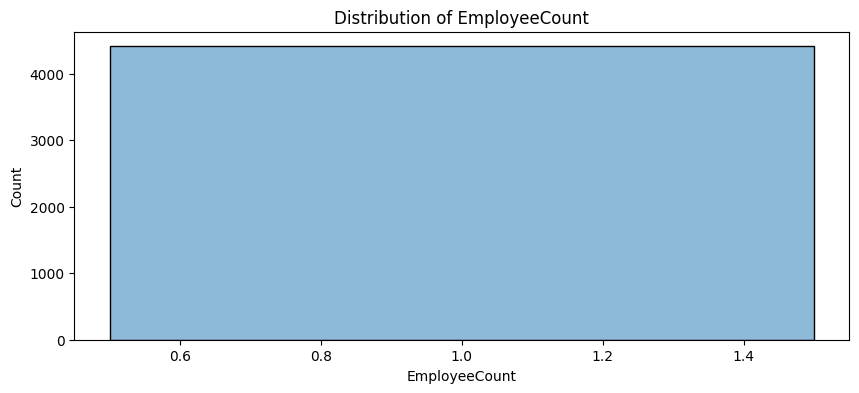

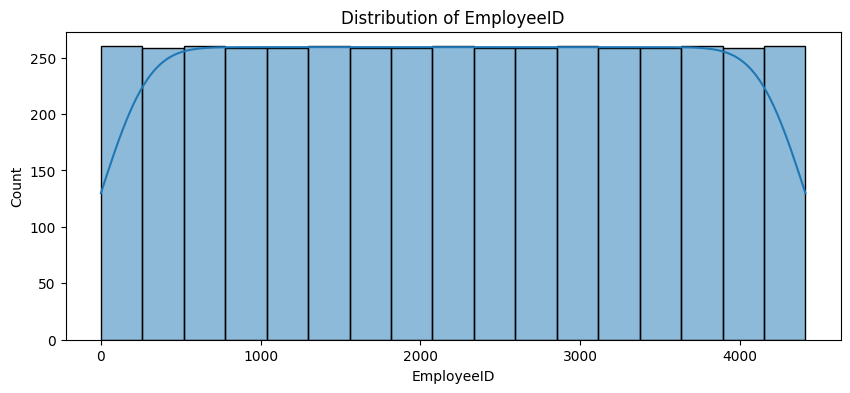

...

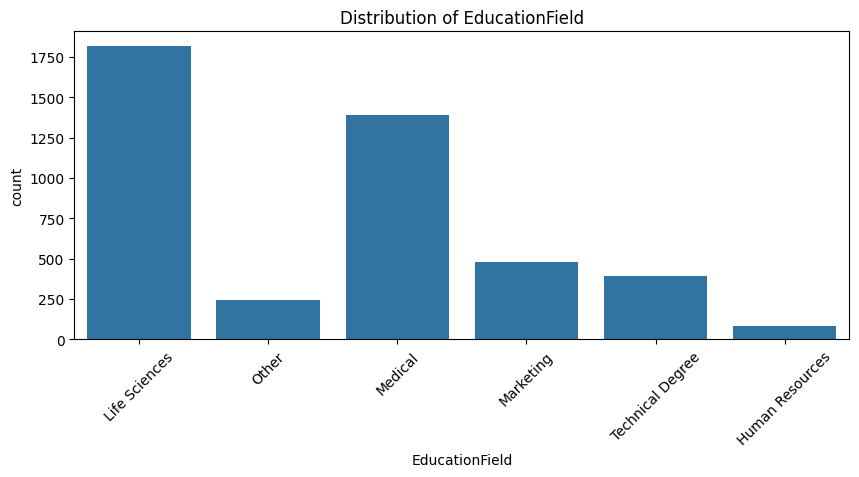

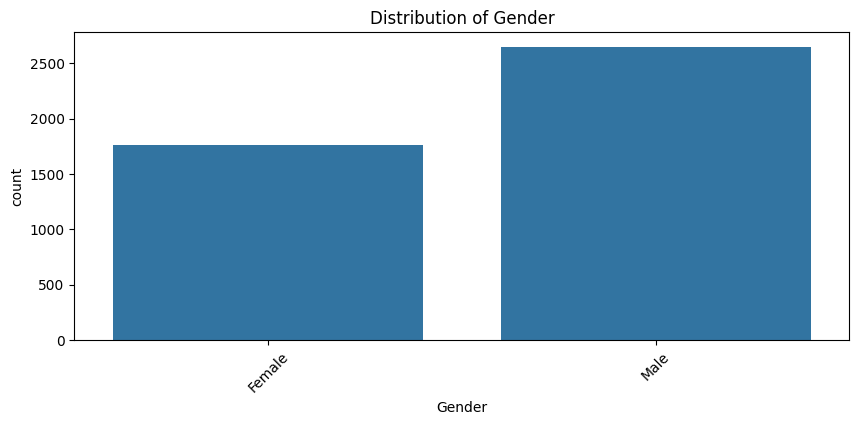

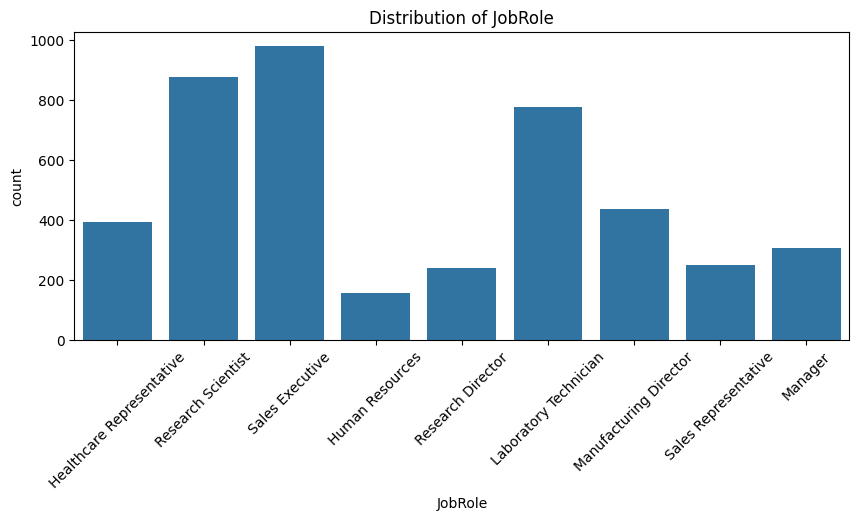

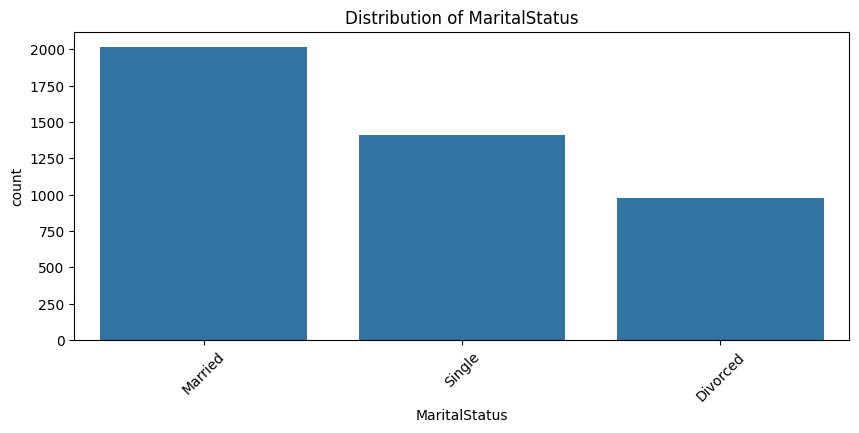

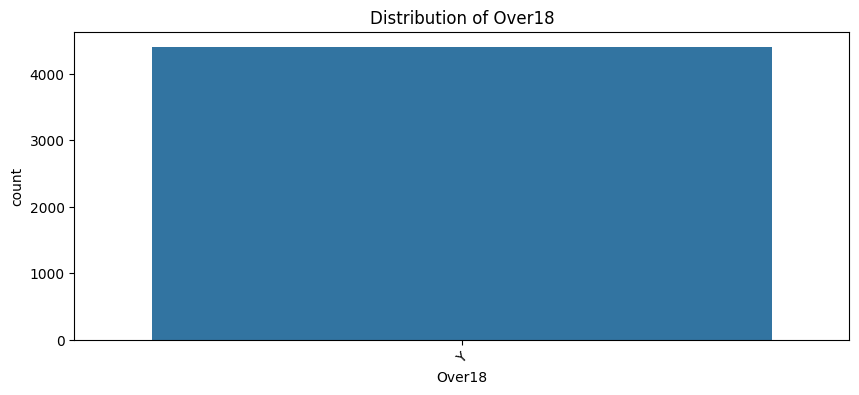

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

for column in numerical_columns:
    plt.figure(figsize=(10, 4))
    sns.histplot(x=merge2[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()    

# Univariate analysis for categorical features
for column in categorical_columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=merge2[column])
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)
    plt.show() # Show plot

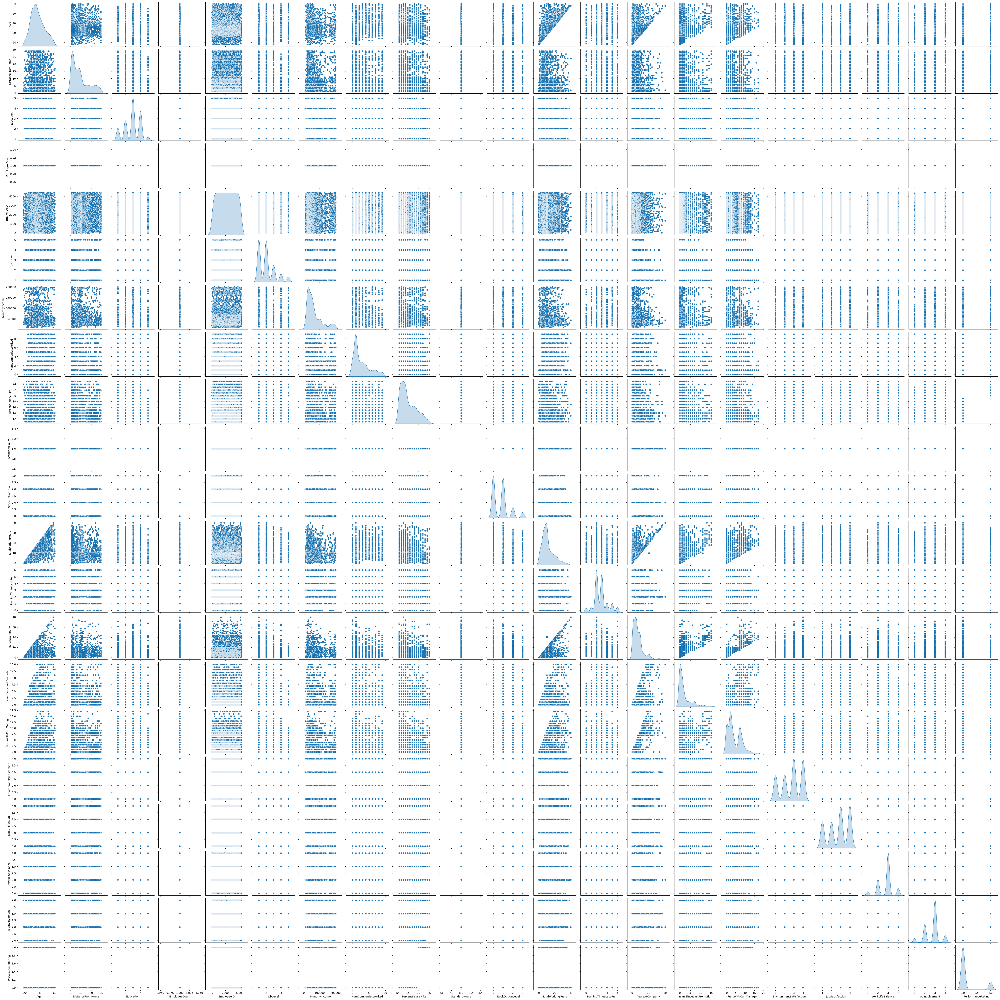

In [7]:
sns.pairplot(merge2[numerical_columns], diag_kind='kde')
plt.show()

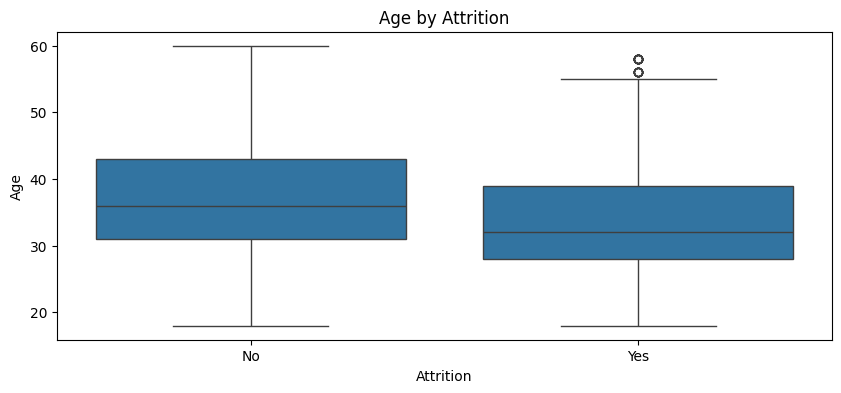

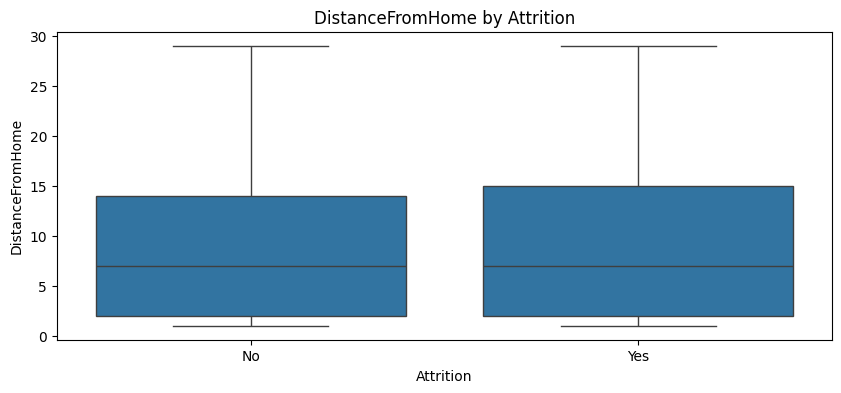

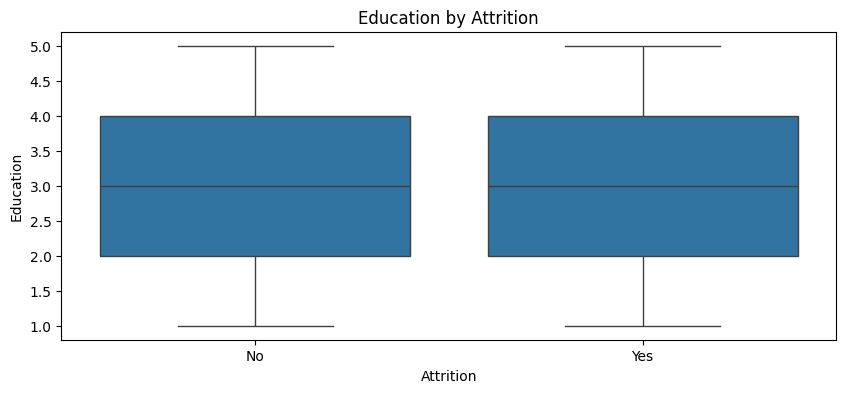

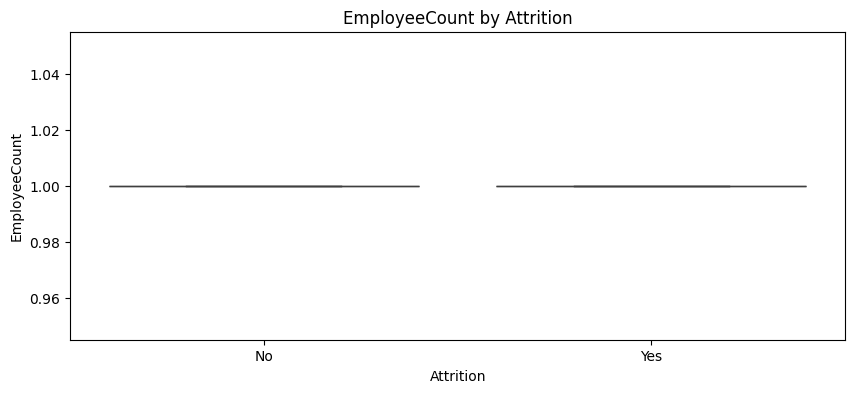

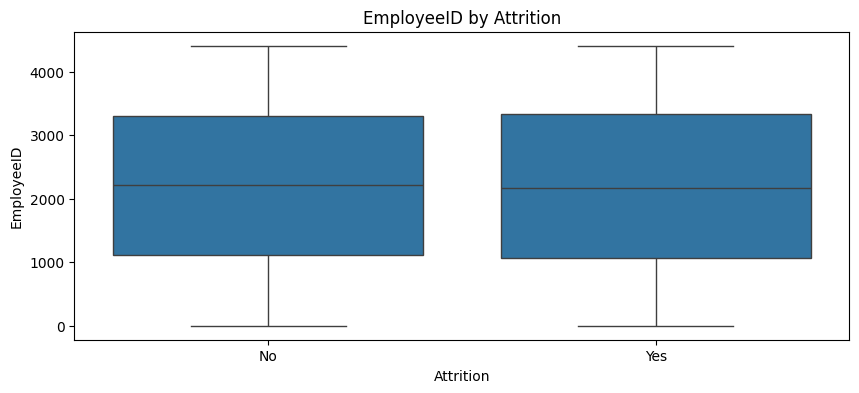

...

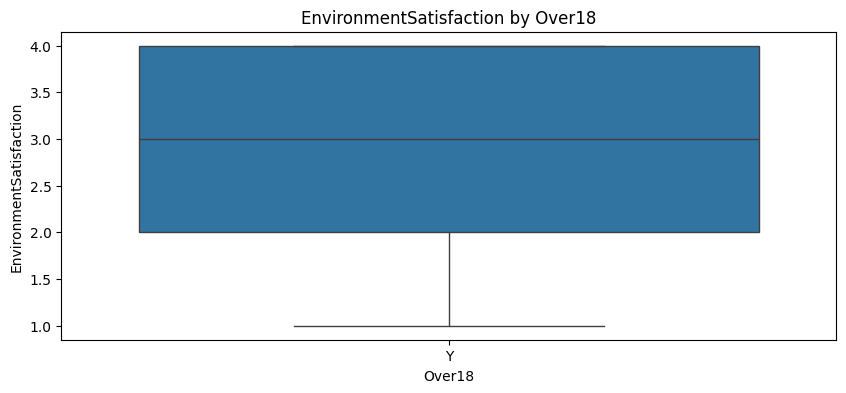

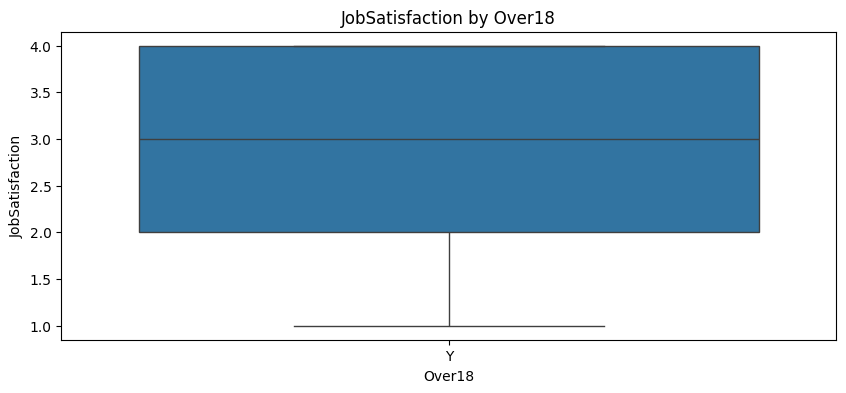

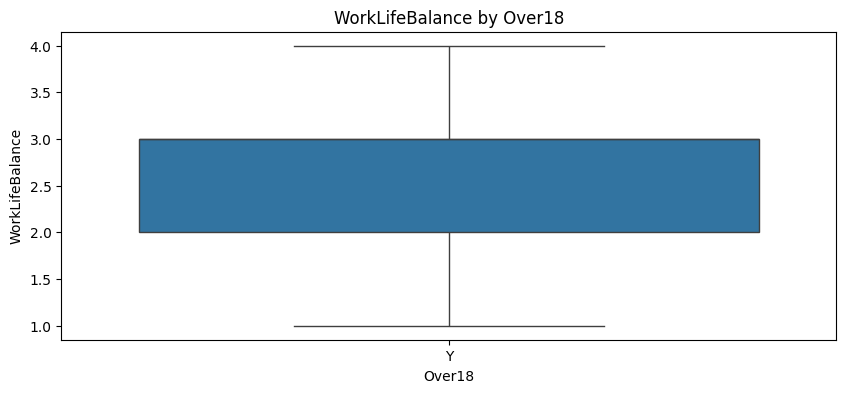

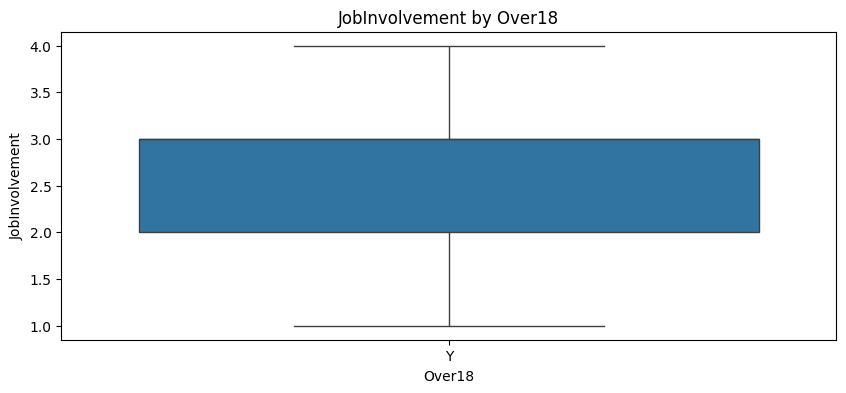

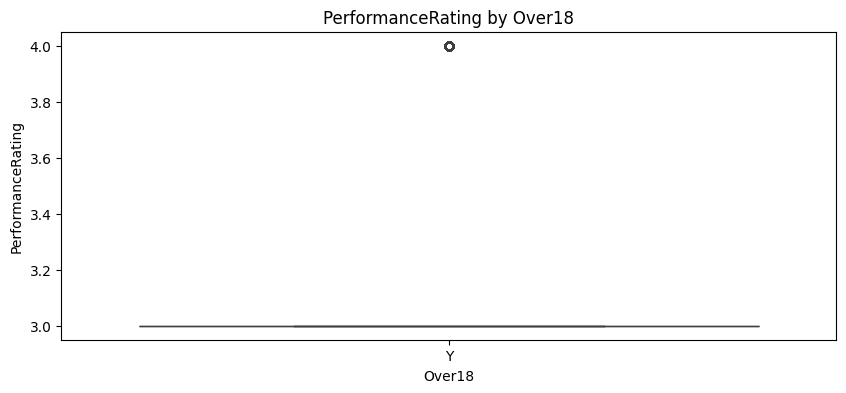

In [8]:
categorical_column = 'Age'

for categorical_column in categorical_columns:
    for column in numerical_columns:
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=merge2[categorical_column], y=merge2[column])
        plt.title(f'{column} by {categorical_column}')
        plt.show()